## 01_data_analysis.ipynb

- 분석 목표

1. 대전 중구 어르신 발화 데이터 탐색적 분석
2. 시간대별 대화 패턴 분석
3. 사용자별 행동 패턴 분석
4. 위험 키워드 빈도 분석
5. 위험 탐지를 위한 특성 추출
<br>

- 데이터 특징

1. **데이터**: (원본데이터)발화데이터(대전중구).xlsx
2. **분석 기간**: 2024년 7월
3. **대상**: 어르신 163명의 AI 인형과의 대화 데이터

### Step1. 라이브러리 및 설정

In [ ]:
!pip install --upgrade pip setuptools wheel
!pip install -r requirements.txt

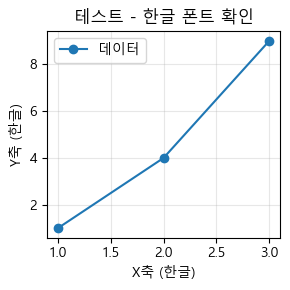


사용 가능한 한글 폰트 목록:
1. Batang
2. Century Gothic
3. HCR Batang
4. HCR Batang Ext
5. HCR Batang ExtB
6. HCR Dotum
7. HCR Dotum Ext
8. Han Santteut Dotum
9. Hancom Gothic
10. KoPubBatang


In [1]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import pandas as pd
import numpy as np

# 한글 폰트 적용
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

# 테스트 플롯
plt.figure(figsize=(3, 3))
plt.title("테스트 - 한글 폰트 확인")
plt.xlabel("X축 (한글)")
plt.ylabel("Y축 (한글)")
plt.plot([1, 2, 3], [1, 4, 9], marker='o', label='데이터')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("\n사용 가능한 한글 폰트 목록:")
font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')
korean_fonts = set()
for f in font_list:
    font_lower = f.lower()
    if any(keyword in font_lower for keyword in ['nanum', 'malgun', 'gothic', 'dotum', 'batang']):
        try:
            font_prop = fm.FontProperties(fname=f)
            korean_fonts.add(font_prop.get_name())
        except:
            pass

for i, font in enumerate(sorted(korean_fonts)[:10], 1):
    print(f"{i}. {font}")

### Step2. 데이터 로딩 및 기본 탐색

* **데이터 규모**: 총 33,135행(Row) 데이터로 구성되어 있으며, 메모리 사용량은 약 3.47 MB임.
* **주요 변수**: 총 3개의 컬럼으로 구성됨.
  * `doll_id`: 인형(로봇) 식별 ID (실수형)
  * `text`: 발화 내용 (문자열)
  * `uttered_at`: 발화 시점 (날짜/시간형)
* **데이터 무결성**: 전체 33,135건 중 유효 데이터는 32,973건이며, 약 **162건의 결측치(Null)**가 포함되어 있어 전처리가 필요함.
* **데이터 특성**: 2025년 7월경 수집된 데이터로 확인되며, '사람이 없으니까', '해 주세요' 등 구어체 위주의 발화 로그가 기록되어 있음.

In [2]:
# 데이터 로딩
FILE_NAME = '../data/(원본데이터)발화데이터(대전중구).xlsx'
df = pd.read_excel(FILE_NAME)

print('\n======================================')
print(f"✅ 데이터 로딩 성공: {len(df):,} 행")

# 기본 정보 출력
print('\n======================================')
print(f"📊 데이터 기본 정보:")
print(f"- 전체 행 수: {len(df):,}")
print(f"- 컬럼 수: {len(df.columns)}")
print(f"- 메모리 사용량: {df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")

# 컬럼 정보
print('\n======================================')
print(f"📋 컬럼 정보:")
print(df.info())

# == 데이터 정리 ==
df.dropna(inplace=True) # 결측치 제거
df['uttered_at'] = pd.to_datetime(df['uttered_at']) # 날짜 형식 변환

# 데이터 미리보기
print('\n======================================')
print("🔍 데이터 미리보기 (상위 5행):")
display(df.head(5))


✅ 데이터 로딩 성공: 33,135 행

📊 데이터 기본 정보:
- 전체 행 수: 33,135
- 컬럼 수: 3
- 메모리 사용량: 3.97 MB

📋 컬럼 정보:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33135 entries, 0 to 33134
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   doll_id     32973 non-null  float64       
 1   text        32973 non-null  object        
 2   uttered_at  32973 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 776.7+ KB
None

🔍 데이터 미리보기 (상위 5행):


,doll_id,text,uttered_at
0,1.0,내가,2025-07-02 14:38:45.863
1,1.0,말씀 하겠네,2025-07-17 10:44:55.222
2,1.0,사람이 없으니까,2025-07-22 10:51:37.251
3,1.0,해 주세요,2025-07-31 10:52:53.973
4,1.0,안 가니까 끝난 거지,2025-07-31 10:53:15.530


### Step3-1 데이터분석 (시간대별 발화 분석)

<ol>
  <li style="line-height: 250%; font-size: 130%;">분석 목적</li>
  - 하루 24시간 동안 어르신들의 발화가 언제 집중적으로 발생하는지를 정량적으로 분석하여, 행동 패턴, 생활 리듬, 이상 징후 탐지 가능성을 도출하는 것을 목표로 한다.<br>
  - 시간 기반 분석을 통해 대상 집단의 일상 구조를 데이터로 재구성하고, 향후 조기 경보 시스템 및 예측 모델링의 기초 지표를 확보하고자 한다.<br><br>

  <li style="line-height: 250%; font-size: 130%;">시간대 별 발화 인원 산출</li>
</ol>

In [3]:
'''해당 시간대에 어르신들이 이야기한 경우 카운트(중복 제외 즉 10시에 a라는 어르신이 여러번 말해도 1명으로 카운트 )'''

dummy = pd.DataFrame(df.groupby(['doll_id',df['uttered_at'].dt.hour]).size().index,columns=["id"])
dummy[['id','hour']] = [[x,y] for x,y in dummy['id']]
dummy.drop_duplicates(inplace=True)
hourly_dummy = dummy.groupby(['hour']).size().reset_index(name='conversations')


# 피크 시간과 최저 시간 식별
peak_hour = hourly_dummy.loc[hourly_dummy['conversations'].idxmax()]
low_hour = hourly_dummy.loc[hourly_dummy['conversations'].idxmin()]

print(f"\n📊 주요 인사이트:")
print(f"- 🔝 최대 대화인원: {peak_hour['hour']}시 ({peak_hour['conversations']}건)")
print(f"- 🔻 최소 대화인원: {low_hour['hour']}시 ({low_hour['conversations']}건)")

# 새벽 시간 대화 비율
night_conversations = hourly_dummy[(hourly_dummy['hour'] >= 22) | (hourly_dummy['hour'] <= 6)]
night_ratio = len(night_conversations) / len(hourly_dummy) * 100

print(f"- 🌙 새벽 시간 대화 비율: {night_ratio:.1f}%")


📊 주요 인사이트:
- 🔝 최대 대화인원: 10.0시 (130.0건)
- 🔻 최소 대화인원: 1.0시 (1.0건)
- 🌙 새벽 시간 대화 비율: 34.8%


<ol start="3">
  <li style="line-height: 250%; font-size: 130%;">꺾은선그래프 및 히트맵으로 표현하기</li>
  - 하루 발화량은 9시~10시와 17시, 20시 전후에 피크를 보이며, 대상 집단의 일상 리듬과 정합성을 갖는 전형적인 쌍봉형(Bimodal) 구조를 나타낸다.<br>
  - 전체 발화의 약 91.2%가 오전 8시부터 오후 20시 사이에 집중되어 있어 활동 중심 구간이 명확하게 형성된다.<br>
  - 심야 시간대(22:00~06:00)의 발화 비율은 약 8.8% 수준으로 낮지만, 해당 시간대의 대화 발생 자체가 평균 패턴에서 벗어난 이상 신호로 활용될 수 있다.<br>
  - 이러한 결과는 시간대별 발화 패턴이 단순한 활동량 지표를 넘어 위험 감지 및 이상행동 탐지 모델의 핵심 변수로 활용될 수 있음을 시사한다.<br>
</ol>


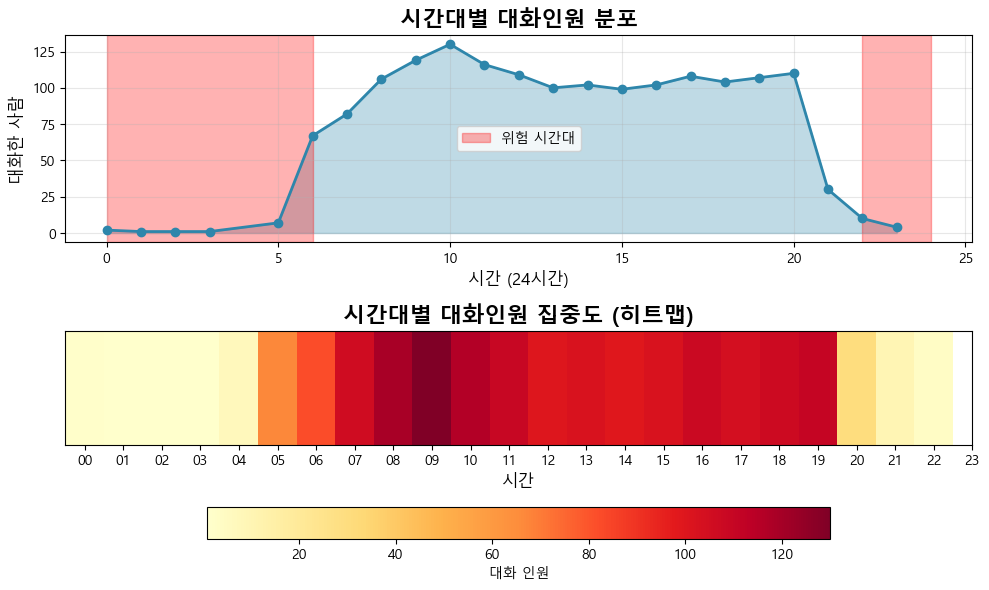

In [4]:
# 시간대별 대화량 시각화
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6))

# 1. 라인 차트
ax1.plot(hourly_dummy['hour'], hourly_dummy['conversations'],
         marker='o', linewidth=2, markersize=6, color='#2E86AB')
ax1.fill_between(hourly_dummy['hour'], hourly_dummy['conversations'],
                alpha=0.3, color='#2E86AB')

# 새벽 시간대 강조
ax1.axvspan(22, 24, alpha=0.3, color='red', label='위험 시간대')
ax1.axvspan(0, 6, alpha=0.3, color='red')

ax1.set_title('시간대별 대화인원 분포', fontsize=16, fontweight='bold')
ax1.set_xlabel('시간 (24시간)', fontsize=12)
ax1.set_ylabel('대화한 사람', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.legend()

# 2. 히트맵 (시간대별 집중도)
hour_matrix = hourly_dummy.set_index('hour')['conversations'].values.reshape(1, -1)
im = ax2.imshow(hour_matrix, cmap='YlOrRd', aspect='auto')

ax2.set_title('시간대별 대화인원 집중도 (히트맵)', fontsize=16, fontweight='bold')
ax2.set_xlabel('시간', fontsize=12)
ax2.set_xticks(range(24))
ax2.set_xticklabels([f'{i:02d}' for i in range(24)])
ax2.set_yticks([])

# 컬러바 추가
cbar = plt.colorbar(im, ax=ax2, orientation='horizontal', pad=0.3, shrink=0.8)
cbar.set_label('대화 인원', fontsize=10)

plt.tight_layout()
plt.show()

<ol start="4">
  <li style="line-height: 250%; font-size: 130%;">분포 해석</li>
  - 발화 활동은 오전 8시 이후 빠르게 증가하며 오전 9~10시에 첫 번째 피크를 기록하고, 이후 저녁 20시까지 완만한 활동이 지속되며, 오후 20시 두 번째 피크를 보인다.<br>
  - 전반적으로 주간 집중-야간 비활동 구조가 뚜렷하게 나타난다.<br>
  - 이는 대상 집단이 주요 활동 시간인 주간 시간대에 발화를 하고 있는 것으로 파악된다.<br><br>

  <li style="line-height: 250%; font-size: 130%;">결과 활용 제언</li>
  - 특히 비활동 구간에서 관찰되는 발화는 평균 패턴에서 벗어난 이상치(Outlier)로 간주할 수 있으며, 심야 시간대의 대화는 행동 변화나 잠재적 이상 신호일 가능성이 있다.<br>
  - 본 분석을 통해 유의미한 시간대별 패턴을 확인하였으나, 금번 위험도 평가 모델링은 시간적 요소보다는 발화 내용 자체에만 초점을 맞추어 개발되었습니다.<br>
  &nbsp&nbsp이에 따라 현재 모델에는 시간적 맥락이 반영되지 않았으나, 향후 심야 시간대 발화 등에 가중치를 부여하는 방식으로 모델을 보완한다면 더욱 정밀한 위험 탐지가 가능할 것입니다.<br>
</ol>

---

### Step3-2 데이터분석 (사용자 기반 분석)
<ol>
  <li style="line-height: 250%; font-size: 130%;">분석 목적</li>
  - 사용자별 대화량의 분포 특성과 집중도를 정량적으로 파악하여, 집단 내 행동 양상의 이질성 및 구조적 패턴을 도출하는 것을 목표로 한다.<br>
  - 특히, 전체 대화량에서 특정 사용자가 차지하는 비중, 활동 편차, 이상치 그룹의 존재 여부를 분석함으로써 향후 행동 예측 모델의 변수로 활용 가능한 인사이트를 확보한다.<br><br>

  <li style="line-height: 250%; font-size: 130%;">대화자별 발화 건수 집계</li>
</ol>

In [5]:
# 사용자별 대화량 통계
df['hour'] = df['uttered_at'].dt.hour
user_stats = df.groupby('doll_id').agg({
    'text': 'count',
    'hour': ['min', 'max', 'std']
}).round(2)

user_stats.columns = ['total_conversations', 'first_hour', 'last_hour', 'hour_std']
user_stats = user_stats.reset_index()

# 상위 사용자 식별
top_users = user_stats.nlargest(15, 'total_conversations')

print(f"👥 사용자 분석 결과:")
print(f"- 총 사용자 수: {len(user_stats)}명")
print(f"- 평균 대화량: {user_stats['total_conversations'].mean():.1f}건")
print(f"- 대화량 표준편차: {user_stats['total_conversations'].std():.1f}건")

# 상위 10명이 차지하는 비율
top10_ratio = top_users.head(10)['total_conversations'].sum() / user_stats['total_conversations'].sum() * 100
print(f"- 상위 10명이 차지하는 비율: {top10_ratio:.1f}%")

print(f"\n🔝 상위 15명 사용자:")
display(top_users)

👥 사용자 분석 결과:
- 총 사용자 수: 163명
- 평균 대화량: 202.3건
- 대화량 표준편차: 325.6건
- 상위 10명이 차지하는 비율: 36.1%

🔝 상위 15명 사용자:


,doll_id,total_conversations,first_hour,last_hour,hour_std
78,79.0,2863,6,21,3.83
148,149.0,1562,6,21,3.88
81,82.0,1146,6,21,4.44
132,133.0,1091,6,20,3.81
27,28.0,1059,6,20,4.97
22,23.0,1007,6,22,3.81
42,43.0,960,6,21,4.13
113,114.0,827,7,20,3.92
41,42.0,762,0,20,4.46
44,45.0,631,6,20,4.18


<ol start=3>
  <li style="line-height: 250%; font-size: 130%;">대화자별 발화건수 그래프로 표현</li>
  <p style="font-size: 110%;">- (그래프1) 상위 15명 사용자 대화량</p>

  - 대화량 1위 사용자는 2위와도 큰 격차를 보이며 독보적인 활동을 기록하였다.<br>
  - 상위 15명의 활동량은 순위가 내려갈수록 급격히 감소하는 계단형 분포를 보였고, 소수 핵심 사용자가 전체 구조를 견인하고 있음을 시사한다.<br>
  - 이는 사용자 집단이 양적으로 균등하지 않고, 특정 그룹에 활동이 집중되는 구조적 특성을 가진다는 것을 보여준다.<br><br>

  <p style="font-size: 110%;">- (그래프2) 전체 사용자 대화량 분포</p>

  - 전체 분포는 긴 오른쪽 꼬리를 가진 비대칭 구조로 나타났으며, 평균보다 낮은 활동을 보이는 사용자가 다수를 차지한다.
  - 이는 평균값이 소수의 고빈도 사용자에 의해 크게 끌어올려진 결과로, 단순 평균 지표만으로 집단 특성을 설명하기 어렵다는 점을 시사한다.


  <p style="font-size: 110%;">- (그래프3) 사용자별 대화량 누적 비율 (파레토 분석)</p>

  - 누적 대화량 기준으로 상위 약 6%의 사용자가 전체 대화의 36.1%를 차지하며, 상위 약 40~50명이 전체의 80%를 점유하는 파레토 구조가 확인되었다.
  - 이는 소수 핵심 그룹이 전체 활동량을 지배하는 구조를 보여주며, 이들의 행동 패턴이 모델링 및 이상 탐지에서 중요한 변수로 작용할 가능성을 제시한다.

  <p style="font-size: 110%;">- (그래프4) 사용자 대화량 분포 (이상치 식별)</p>

- 박스플롯 분석 결과, 다수 사용자는 하위 영역에 밀집되어 있으나 일부 사용자는 통계적으로 이례적인 수준의 대화량을 보였다.
- 이러한 이상치 그룹은 단순히 양적 차이를 넘어 행동 특성 자체가 다른 집단으로 분류될 수 있으며, 특이 행동 탐지나 행동 유형 분류 모델에서 중요한 역할을 할 수 있다.
</ol>

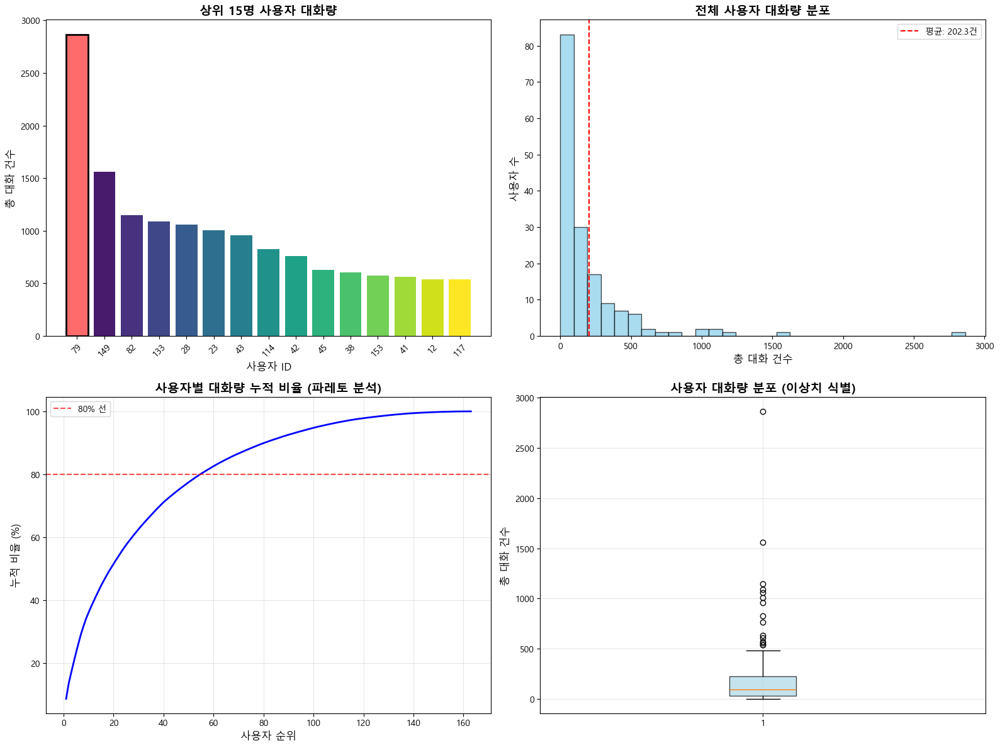

In [6]:
# 사용자별 대화량 분포 시각화
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))

# 1. 상위 15명 바차트
colors = plt.cm.viridis(np.linspace(0, 1, len(top_users)))
bars = ax1.bar(range(len(top_users)), top_users['total_conversations'], color=colors)

# 최고 사용자 강조
bars[0].set_color('#FF6B6B')
bars[0].set_edgecolor('black')
bars[0].set_linewidth(2)

ax1.set_title('상위 15명 사용자 대화량', fontsize=14, fontweight='bold')
ax1.set_xlabel('사용자 ID', fontsize=12)
ax1.set_ylabel('총 대화 건수', fontsize=12)
ax1.set_xticks(range(len(top_users)))

# [수정] X축 라벨을 순위(#1) 대신 doll_id로 변경 (보기 좋게 int로 변환)
ax1.set_xticklabels(top_users['doll_id'].astype(int), rotation=45)

# 2. 전체 사용자 대화량 분포 (히스토그램)
ax2.hist(user_stats['total_conversations'], bins=30, alpha=0.7, color='skyblue', edgecolor='black')
ax2.axvline(user_stats['total_conversations'].mean(), color='red', linestyle='--',
            label=f'평균: {user_stats["total_conversations"].mean():.1f}건')
ax2.set_title('전체 사용자 대화량 분포', fontsize=14, fontweight='bold')
ax2.set_xlabel('총 대화 건수', fontsize=12)
ax2.set_ylabel('사용자 수', fontsize=12)
ax2.legend()

# 3. 누적 비율 (파레토 차트)
sorted_conversations = user_stats['total_conversations'].sort_values(ascending=False)
cumulative_ratio = (sorted_conversations.cumsum() / sorted_conversations.sum() * 100)

ax3.plot(range(1, len(cumulative_ratio) + 1), cumulative_ratio, 'b-', linewidth=2)
ax3.axhline(80, color='red', linestyle='--', alpha=0.7, label='80% 선')
ax3.set_title('사용자별 대화량 누적 비율 (파레토 분석)', fontsize=14, fontweight='bold')
ax3.set_xlabel('사용자 순위', fontsize=12)
ax3.set_ylabel('누적 비율 (%)', fontsize=12)
ax3.grid(True, alpha=0.3)
ax3.legend()

# 4. 박스플롯 (이상치 식별)
box_plot = ax4.boxplot(user_stats['total_conversations'], patch_artist=True,
                       boxprops=dict(facecolor='lightblue', alpha=0.7))
ax4.set_title('사용자 대화량 분포 (이상치 식별)', fontsize=14, fontweight='bold')
ax4.set_ylabel('총 대화 건수', fontsize=12)
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

<ol start=4>
  <li style="line-height: 250%; font-size: 130%;">주요 결과 요약</li>
  - 전체 사용자 163명 중 평균 대화량은 202.3건이었으며, 상위 10명이 전체 대화의 약 36.1%를 차지하였다.<br>
  - 상위 15명의 대화량은 급격히 감소하는 계단형 구조를 보이며, 극소수의 사용자가 압도적으로 많은 활동을 보였다.<br>
  - 대부분의 사용자는 평균 이하의 활동 수준을 보이며, 분포는 오른쪽 꼬리가 긴(Right-Skewed) 형태로 나타났다.<br>
  - 약 40~50명 사용자가 전체 대화의 80%를 차지하는 파레토(Pareto) 구조를 보이며, 일부 사용자는 통계적으로 이상치(Outlier) 수준의 활동량을 기록하였다.<br><br>

  <li style="line-height: 250%; font-size: 130%;">종합 결론</li>
  - 사용자별 대화량 분석 결과, 전체 집단은 활동 수준에 따라 ‘일반 사용자 그룹’과 ‘핵심 사용자 그룹’으로 뚜렷하게 분화되는 양상을 보였다.<br>
  - 극소수 핵심 사용자가 전체 활동량의 상당 부분을 차지하며, 이들의 패턴은 모델링과 이상 행동 탐지의 핵심 변수로 활용될 수 있다.<br>
  - 마찬가지로 현재 모델에는 해당 특이 사항을 반영하지 않았으나, 분류 결과 도출 후 관련 부분을 고려하여 담당자가 판단할 수 있는 중요한 단서를 제공할 수 있다.<br><br>
</ol>

---

### Step3-3 데이터분석 (단어 빈도 기반 분석)

<ol>
  <li style="line-height: 250%; font-size: 130%;">분석 목적</li>
  - 실제 발화 텍스트를 자연어 처리(NLP) 기술을 통해 구조화하고, 이를 기반으로 대화의 핵심 주제와 관심사를 도출하는 것을 목표로 한다.<br>
  - 비정형 텍스트 데이터를 정형 데이터로 가공함으로써 대화 내용을 체계적으로 이해하고, 향후 행동 예측·주제 모델링에 활용 가능한 기반 데이터를 확보한다.<br><br>

  <li style="line-height: 250%; font-size: 130%;">주요 결과 요약</li>
  - 텍스트는 토큰화(Tokenization) 및 표제어 추출 과정을 통해 분석 가능한 단어 단위로 정제되었다.<br>
  - 명사·동사·형용사 중심으로 품사를 분류하여 어르신들의 언어 사용 패턴을 구조화하였다.<br>
  - 워드클라우드 분석 결과, 발화 내용은 건강 상태, 사회적 관계, 감정 표현이라는 세 가지 주요 주제로 군집화되었다.<br>
  - 감정 및 심리 상태를 나타내는 어휘의 빈도가 높아, 발화가 단순 정보 전달을 넘어 정서 표현의 수단으로 기능함을 시사한다.<br><br>


  <li style="line-height: 250%; font-size: 130%;">분석 과정 및 설명</li>

  <p style="font-size: 110%;">- 토큰화 및 품사 분석</p>

  - 텍스트를 의미 있는 최소 단위인 단어로 분해하고, '아팠다 → 아프다'처럼 기본형(표제어)으로 변환하여 데이터의 일관성을 확보하였다.
  - 명사(NNG, NNP 등), 동사(VV 등), 형용사(VA 등) 중심으로 품사를 태깅함으로써 주요 개념군을 식별할 수 있는 기반을 마련하였다.
  - 이 전처리 과정은 이후 모든 주제 분석 및 감정 분석의 정확성을 결정하는 핵심 절차이다.


  <p style="font-size: 110%;">- 구조화된 단어 데이터프레임</p>

  - 각 단어는 doc_id(문서 식별자), word(원형), lemma(표제어), pos(품사) 정보와 함께 구조화되었다.
  - 이를 통해 "어떤 단어가 몇 번 등장했는가", "어떤 품사의 단어가 주로 사용되는가" 등의 통계적 분석이 가능해졌다.
  - 이 데이터는 워드클라우드·주제 모델링 등 상위 분석 단계의 기초 자료 역할을 한다.

  <p style="font-size: 110%;">- 주요 단어 분포 및 워드클라우드 분석</p>

  - 단어 빈도를 기반으로 한 워드클라우드에서는 다음과 같은 주제별 핵심 어휘군이 확인되었다:

  | 주제 영역 | 주요 키워드 | 의미 |
  |-----------|------------|------|
  | 건강/신체 상태 | 아프다, 병원, 없다 | 신체적 상태 및 건강 문제에 대한 직접적 언급 |
  | 관계/사회적 연결 | 사람, 우리, 엄마, 자식, 친구 | 가족·지인과의 관계 및 사회적 소속감 강조 |
  | 감정/심리 표현 | 마음, 생각, 기분, 괜찮다, 고맙다 | 감정 상태 표현 및 정서적 소통의 중요성 반영 |
  
  <br>

  - 단어 빈도의 크기로 주제를 시각화한 결과, 건강 관련 단어와 관계를 나타내는 단어가 빈번하게 등장했으며, 이는 어르신들의 대화가 주로 ‘자신의 몸 상태’와 ‘사회적 관계’에 집중되어 있음을 보여준다.
  - 감정 표현 단어의 다빈도 출현은 어르신들이 단순한 정보 교환을 넘어 자신의 심리 상태를 적극적으로 언어화한다는 점을 시사한다.
</ol>

🎯=== 문장 토큰화 실행 === 
training was done. used memory 0.213 Gb
all cohesion probabilities was computed. # words = 7797
all branching entropies was computed # words = 9641
all accessor variety was computed # words = 9641
원래문장:  내가 
결과 예시:  ['내가']

🎯=== 품사 분류 실행 === 
안전한 경로(C:\kiwi_temp)에 모델이 이미 있습니다.
>>> 성공! Kiwi가 정상적으로 로드되었습니다.

✅ 총 116402개의 단어 추출 완료


,doc_id,word,lemma,pos
0,0,나,나,NP
1,1,말씀,말씀,NNG
2,1,하,하다,VV
3,2,사람,사람,NNG
4,2,없,없다,VA


📌 불용어 제거 후: 84856개의 단어

📊 상위 30개 표제어:
lemma
주다     2792
먹다     1757
오다     1636
노래     1566
늘다     1154
좋다     1145
없다     1143
도      1114
부르다    1054
얘기      855
알다      839
전화      716
우리      706
사람      644
지       606
을       564
모르다     559
집       556
은       555
않다      538
돌       532
엄마      530
곰       525
같다      471
여기      456
나가다     424
만       424
일       422
가지다     411
생각      404
Name: count, dtype: int64

🎯=== 표제어 기반 빈도 워드클라우드 실행 ===
✅ 폰트 발견: C:/Windows/Fonts/malgun.ttf


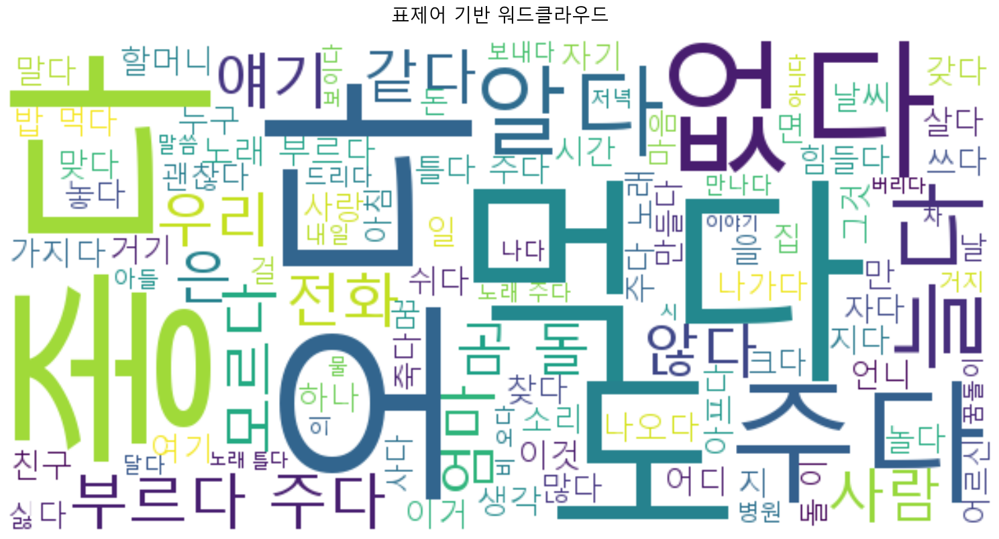


🎯=== 빈도 막대 그래프 ===


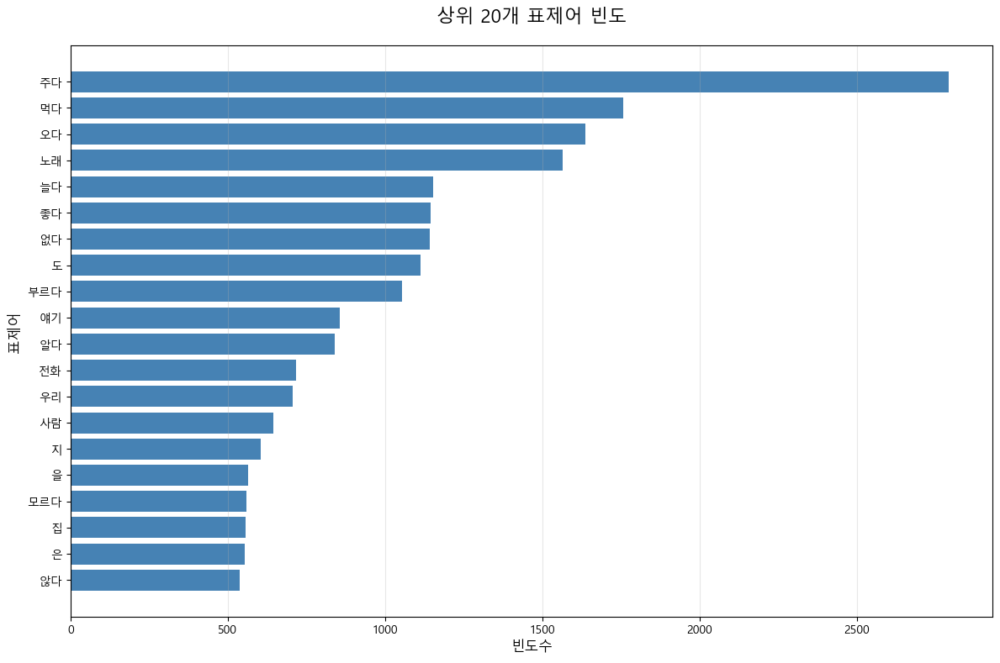


🎯=== 품사별 분석 ===

품사별 단어 수:
pos
NNG    44791
VV     21917
VA      6245
NP      4671
NNP     3734
VX      1913
NR      1453
VCN      132
Name: count, dtype: int64

[일반명사 (NNG)] 상위 10개:
lemma
노래    1566
도     1114
얘기     855
전화     716
사람     644
을      564
집      556
은      555
돌      532
엄마     530
Name: count, dtype: int64

[고유명사 (NNP)] 상위 10개:
lemma
꿈돌이    150
대전      77
서울      74
김       73
한국      69
랑       61
뜨거      56
목포      49
박       47
용두산     42
Name: count, dtype: int64

[동사 (VV)] 상위 10개:
lemma
주다     2674
먹다     1757
오다     1562
늘다     1154
부르다    1054
알다      839
모르다     559
틀다      403
나오다     372
나가다     365
Name: count, dtype: int64

[형용사 (VA)] 상위 10개:
lemma
좋다     1145
없다     1143
같다      471
힘들다     325
아프다     311
많다      302
맛있다     264
괜찮다     185
크다      161
싫다      159
Name: count, dtype: int64


In [7]:
# === 토큰화 soynlp 단어 학습 ===
from soynlp.word import WordExtractor
from soynlp.tokenizer import LTokenizer
print("🎯=== 문장 토큰화 실행 === ")

# WordExtractor 학습
texts = df['text'].dropna().astype(str).tolist()
word_extractor = WordExtractor()
word_extractor.train(texts)

# 단어 점수 추출 (결합력 기준)
word_scores = word_extractor.extract()
scores = {word: score.cohesion_forward for word, score in word_scores.items()}

# 점수 기반 LTokenizer 생성
tokenizer = LTokenizer(scores=scores)

# 문장별로 토큰화 수행
soynlp_tokens = [tokenizer.tokenize(sent) for sent in texts]
print('원래문장: ', texts[0])
print('결과 예시: ', soynlp_tokens[0])

second_tokens = [" ".join(x) for x in soynlp_tokens]

# === 품사 분류 ===
print("\n🎯=== 품사 분류 실행 === ")
import shutil
import os
import kiwipiepy_model
from kiwipiepy import Kiwi

# 1. 모델이 있는 원래 경로(문제가 되는 OneDrive/한글 경로) 찾기
original_path = kiwipiepy_model.get_model_path()

# 2. C드라이브 최상단에 안전한 임시 폴더 만들기 (C:\kiwi_temp)
safe_path = "C:\\kiwi_temp"

# 3. 모델 파일을 안전한 곳으로 강제 복사
if not os.path.exists(safe_path):
    print(f"모델을 안전한 경로({safe_path})로 복사 중...")
    shutil.copytree(original_path, safe_path)
else:
    print(f"안전한 경로({safe_path})에 모델이 이미 있습니다.")

# 4. 복사한 경로를 이용해 Kiwi 실행
try:
    kiwi = Kiwi(model_path=safe_path)
    print(">>> 성공! Kiwi가 정상적으로 로드되었습니다.")
except Exception as e:
    print(f">>> 오류 발생: {e}")

# --- 품사 태그 세트 정의 ---
noun_tags = {'NNG', 'NNP', 'NR', 'NP'} # 명사류
verb_tags = {'VV', 'VX', 'VCP', 'VCN'} # 동사류
adjective_tags = {'VA'}                # 형용사류

# 명사/동사/형용사를 분리 + 표제어/표면형 같이 저장
def extract_word_lemma_dict(tokens):
    result = {}

    for token in tokens:
        try:
            analyzed = kiwi.tokenize(token)
            for t in analyzed:
                if t.tag in noun_tags or t.tag in verb_tags or t.tag in adjective_tags:
                    result[t.form] = {
                        "lemma": t.lemma,
                        "pos": t.tag
                    }
        except Exception as e:
            print(f"⚠️ Error on token '{token}': {e}")
            continue

    return result

# 필터링된 결과 얻기 (리스트의 각 원소가 딕셔너리 형태)
filtered_structured_tokens = [extract_word_lemma_dict(tokens) for tokens in soynlp_tokens]

# 각 문서(리스트 요소)에서 단어와 해당 정보를 추출하여 데이터프레임으로 변환
word_df = pd.DataFrame([
    {'doc_id': idx, 'word': word, 'lemma': info['lemma'], 'pos': info['pos']}
    for idx, doc in enumerate(filtered_structured_tokens)
    for word, info in doc.items()
])

print(f"\n✅ 총 {len(word_df)}개의 단어 추출 완료")
display(word_df.head())

# 불용어 제거
stop = [
    '하다', '이다', '나', '서', '르', '뭐', '그러다', '너', '가다', '되다',
    '저', '있다', '보다', '라', '으', '로', '싶다', '그거', '것', '수',
    '때', '년', '말', '거', '곳', '점', '게', '등', '더', '안', '못'
]

word_df = word_df[~word_df['lemma'].isin(stop)]
print(f"📌 불용어 제거 후: {len(word_df)}개의 단어")

# === 빈도 분석 ===
print("\n📊 상위 30개 표제어:")
lemma_freq = word_df['lemma'].value_counts().head(30)
print(lemma_freq)

# === 워드클라우드 생성 (폰트 경로 자동 설정) ===
print("\n🎯=== 표제어 기반 빈도 워드클라우드 실행 ===")
from wordcloud import WordCloud
import platform
import os

# 한글 폰트 경로 자동 찾기
def get_korean_font_path():
    system = platform.system()

    # 가능한 폰트 경로들
    font_paths = []

    if system == 'Windows':
        font_paths = [
            'C:/Windows/Fonts/malgun.ttf',
            'C:/Windows/Fonts/gulim.ttc',
            'C:/Windows/Fonts/batang.ttc'
        ]
    elif system == 'Darwin':  # macOS
        font_paths = [
            '/System/Library/Fonts/AppleGothic.ttf',
            '/Library/Fonts/AppleGothic.ttf'
        ]
    else:  # Linux (Colab 포함)
        font_paths = [
            '/usr/share/fonts/truetype/nanum/NanumGothic.ttf',
            '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf',
            '/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf'
        ]

    # 존재하는 첫 번째 폰트 반환
    for path in font_paths:
        if os.path.exists(path):
            print(f"✅ 폰트 발견: {path}")
            return path

    # 폰트를 찾지 못한 경우 설치 시도 (Linux/Colab)
    if system == 'Linux':
        print("⚠️ 한글 폰트를 찾을 수 없습니다. 나눔고딕 설치 중...")
        os.system('apt-get update -qq')
        os.system('apt-get install -y fonts-nanum fonts-nanum-coding')

        # 설치 후 다시 확인
        for path in font_paths:
            if os.path.exists(path):
                print(f"✅ 폰트 설치 완료: {path}")
                return path

    print("⚠️ 한글 폰트를 찾을 수 없습니다. 기본 폰트 사용")
    return None

# 폰트 경로 가져오기
font_path = get_korean_font_path()

# 워드클라우드 생성
text = " ".join(word_df['lemma'].dropna().astype(str))

if font_path:
    wc = WordCloud(
        font_path=font_path,
        width=600,
        height=300,
        background_color='white',
        max_words=100,
        relative_scaling=0.3,
        colormap='viridis',
        min_font_size=10
    ).generate(text)
else:
    # 폰트가 없을 경우 영문 전용으로 생성
    wc = WordCloud(
        width=600,
        height=300,
        background_color='white',
        max_words=100,
        relative_scaling=0.3,
        colormap='viridis',
        min_font_size=10
    ).generate(text)

# 시각화
plt.figure(figsize=(15, 8))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title('표제어 기반 워드클라우드', fontsize=20, pad=20)
plt.tight_layout()
plt.show()

# === 빈도 막대 그래프 ===
print("\n🎯=== 빈도 막대 그래프 ===")
top_20 = word_df['lemma'].value_counts().head(20)

plt.figure(figsize=(12, 8))
plt.barh(range(len(top_20)), top_20.values, color='steelblue')
plt.yticks(range(len(top_20)), top_20.index)
plt.xlabel('빈도수', fontsize=12)
plt.ylabel('표제어', fontsize=12)
plt.title('상위 20개 표제어 빈도', fontsize=16, pad=20)
plt.gca().invert_yaxis()
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# === 품사별 분석 ===
print("\n🎯=== 품사별 분석 ===")
pos_counts = word_df['pos'].value_counts()
print("\n품사별 단어 수:")
print(pos_counts)

# 품사별 상위 단어
pos_names = {
    'NNG': '일반명사',
    'NNP': '고유명사',
    'VV': '동사',
    'VA': '형용사'
}

for pos, name in pos_names.items():
    if pos in word_df['pos'].values:
        print(f"\n[{name} ({pos})] 상위 10개:")
        top_words = word_df[word_df['pos'] == pos]['lemma'].value_counts().head(10)
        print(top_words)

<ol start=4>
  <li style="line-height: 250%; font-size: 130%;">데이터 기반 인사이트</li>

  | 인사이트 | 데이터 해석 | 활용 가능성 |
  |----------|-------------|--------------|
  | 건강 중심 대화 | '아프다', '병원' 등 신체 상태 언급 빈도 높음 | 건강 상태 변화 감지 및 이상 징후 조기 탐지 |
  | 관계성 강조 | '엄마', '자식', '우리' 등 가족 관련 단어 다수 | 사회적 연결성 지표로 활용 가능 |
  | 감정 표현 강조 | '마음', '기분', '괜찮다' 등 정서 표현 어휘 다수 | 감정 변화 추적 및 심리 상태 분석 모델에 적용 |
  | 데이터 구조화 성과 | 토큰화·표제어·품사 구조 확보 | 주제 모델링, 감정 분석, 연관어 분석 등 심층 분석 기반 마련 |


  <li style="line-height: 250%; font-size: 130%;">종합 결론</li>

  - 텍스트 분석 결과, 어르신들의 대화는 건강 상태, 인간관계, 감정 표현이라는 세 가지 축을 중심으로 전개되는 것으로 나타났다.
  - 이 중에서도 건강과 관계는 가장 핵심적인 주제로, 발화 내용 전반을 지배하는 주요 관심사임이 확인되었다.
  - 감정 표현 관련 어휘가 높은 빈도로 등장한 점은 텍스트가 정보 교환 이상의 정서적 소통 수단으로 기능하고 있음을 보여준다.
  - 구조화된 언어 데이터는 향후 주제 변화 분석, 감정 추세 추적, 사용자 그룹별 관심사 차이 분석 등 다양한 심층 분석의 출발점이 될 수 있다.

</ol>

---

### Step3-4 데이터분석 (토픽 분석 berttopic 활용)

<ol>
  <li style="line-height: 250%; font-size: 130%;">분석 목적</li>
  - BERTopic은 문맥적 의미를 파악하여 의미적으로 유사한 문장을 자동으로 그룹화(주제화)하는 AI 기반 분석 기법이다.<br>
  - 약 100개의 세부 토픽을 도출하고 이를 의미적으로 통합하여 5가지 핵심 카테고리로 재구성했다.

  <li style="line-height: 250%; font-size: 130%;">주요 주제군 요약</li>

  | 핵심 카테고리 | 주요 키워드 | 해석 |
  |---------------|------------|------|
  | 건강 & 신체 상태 | 아프다, 병원, 허리, 다리 | 신체 통증과 의료기관 언급이 가장 많으며 건강이 일상의 핵심 관심사임 |
  | 가족 & 사회 관계 | 우리, 엄마, 자식, 아들 | 가족 중심의 대화가 두드러지며 정서적 연결 욕구를 반영 |
  | 일상 & 안부 | 오늘, 날씨, 아침, 하루 | 반복되는 일상과 안부 인사가 독립된 대화 축을 형성 |
  | 감정 & 내면 상태 | 고맙다, 괜찮다, 마음 | 감정 표현 빈도가 높으며 심리적 교감의 중요성을 보여줌 |
  | 기능적 활용 | 노래, 틀어줘, 전화, 안되다 | 음악·전화 등 실생활 기능 활용 및 관련 불편 표현 존재 |

</ol>

In [8]:
# bert topic 모델로 키워드
'''berttopic로 키워드 분석을 했지만 현재 전체 대화턴을 기준으로 했으므로 각 사람마다 적용하는것도 가능'''

# SentenceTransformer 로딩 (다국어 모델 사용)
from sentence_transformers import SentenceTransformer
from bertopic import BERTopic # berttopic
from sentence_transformers import SentenceTransformer
from hdbscan import HDBSCAN

Sentence_model = SentenceTransformer('paraphrase-multilingual-MiniLM-L12-v2').to('cpu')

# 토픽 분석 나타내기
def remove_brands(text, brand_list):
    for brand in brand_list:
        text = text.replace(brand, '')
    return text


def file_keywords_bert(text, Sentence_model ,size=50):

    # 지나치게 많은 토픽을 생성하지 않게 조정
    hdbscan_model = HDBSCAN(min_cluster_size=size, min_samples=5, metric='euclidean', cluster_selection_method='eom')

    # 불용어 제거
    # 문서 임베딩 (리스트 형태로 한 번에 처리)
    embeddings = Sentence_model.encode(text)

    # BERTopic 모델 학습 (한국어 지원)
    topic_model = BERTopic(language="multilingual", embedding_model=Sentence_model,nr_topics=None  ,hdbscan_model=hdbscan_model)

    # 문서에서 토픽 추출
    topics, probs = topic_model.fit_transform(text, embeddings)

    print(f"초기 토픽 개수: {len(set(topics))}")
    print()
    return topic_model, topics, probs

print(f'------------------------------------------------------')
model, topics, probs = file_keywords_bert(df['text'].dropna().astype(str).tolist(), Sentence_model ,size=10)

c:\Users\user\OneDrive\바탕 화면\새 폴더\.venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


------------------------------------------------------
초기 토픽 개수: 735



In [12]:
# === 시각화 1: 막대 그래프 (상위 토픽) ===
print("\n🎯=== 토픽별 문서 수 막대 그래프 ===")
display(model.visualize_barchart(top_n_topics=100))


🎯=== 토픽별 문서 수 막대 그래프 ===


In [ ]:
# === 시각화 2: 토픽 간 거리 맵 ===
print("\n🎯=== 토픽 간 거리 시각화 ===")
try:
    fig2 = model.visualize_topics(width=1000, height=800)
    fig2.show()
except Exception as e:
    print(f"⚠️ 토픽 거리 시각화 실패: {e}")


🎯=== 토픽 간 거리 시각화 ===


In [14]:

# === 시각화 3: 토픽 계층 구조 ===
print("\n🎯=== 토픽 계층 구조 ===")
try:
    hierarchical_topics = model.hierarchical_topics(texts)
    fig3 = model.visualize_hierarchy(hierarchical_topics=hierarchical_topics, width=1000, height=800)
    fig3.show()
except Exception as e:
    print(f"⚠️ 계층 구조 시각화 실패: {e}")



🎯=== 토픽 계층 구조 ===


100%|██████████| 740/740 [00:04<00:00, 181.84it/s]


In [ ]:
# === 시각화 4: 히트맵 ===
print("\n🎯=== 토픽 유사도 히트맵 ===")
try:
    fig4 = model.visualize_heatmap(n_clusters=20, width=1000, height=800)
    fig4.show()
except Exception as e:
    print(f"⚠️ 히트맵 시각화 실패: {e}")



🎯=== 토픽 유사도 히트맵 ===


In [17]:
# === 토픽 정보 출력 ===
print("\n🎯=== 토픽 정보 ===")
topic_info = model.get_topic_info()
print(f"\n상위 10개 토픽:")
display(topic_info.head(10))

# === 개별 토픽 상세 정보 ===
print("\n🎯=== 상위 5개 토픽 상세 정보 ===")
for topic_id in range(min(5, len(topic_info)-1)):
    if topic_id == -1:
        continue

    print(f"\n{'='*60}")
    print(f"Topic {topic_id} (문서 수: {topic_info[topic_info['Topic']==topic_id]['Count'].values[0]})")
    print(f"{'='*60}")

    # 토픽 키워드
    topic_words = model.get_topic(topic_id)
    if topic_words:
        print("주요 키워드:")
        for word, score in topic_words[:10]:
            print(f"  • {word}: {score:.4f}")

    # 대표 문서
    print("\n대표 문서 (상위 3개):")
    topic_docs = [texts[i] for i, t in enumerate(topics) if t == topic_id][:3]
    for i, doc in enumerate(topic_docs, 1):
        print(f"  {i}. {doc[:100]}...")



🎯=== 토픽 정보 ===

상위 10개 토픽:


,Topic,Count,Name,Representation,Representative_Docs
0,-1,12319,-1_내가_하고_그래서_이렇게,"[내가, 하고, 그래서, 이렇게, 그냥, 갖고, 그거, 이제, 이거, 그런]","[그렇게 안 해도 안 주고 갔다, 무슨 말을 해 아까 얘기 하는데, 엄마 이게 안 ..."
1,0,453,0_효능_달력_뉴스_판도라,"[효능, 달력, 뉴스, 판도라, 루모스, 로얄, 보릿고개, 요가, 에어컨, 지도]","[달력, 달력 달력, 연속극 뉴스]"
2,1,424,1_더워_더워서_날씨가_더워요,"[더워, 더워서, 날씨가, 더워요, 더우니까, 너무, 뜨거워서, 더운데, 바깥에, 무지]","[날씨가 너무 더워, 날씨가 너무 더워, 더워서 더워]"
3,2,276,2_아니야_심심하지_나가셨어_의미가,"[아니야, 심심하지, 나가셨어, 의미가, 싫다고요, 필요, 아니에요, 아니다, 준대...","[심심하지 않고, 심심하지 않고, 아니야 그냥]"
4,3,242,3_10만_5만_3만_000원,"[10만, 5만, 3만, 000원, 원씩, 50만, 100만, 5천, 얼마야, 돈을]",[지금부터라도 늦지 않았으니까 아이들이라도 좀 잘 살아갈 수 있게 만들어 줬으면 좋...
5,4,220,4_잠이_자고_잠을_자려고,"[잠이, 자고, 잠을, 자려고, 자야지, 깨워, 자면, 졸려, 잠도, 일어났어]","[자고, 잠이 안 와 가지고, 난 잠이 안 깨]"
6,5,172,5_꿈들이_꿈돌이_꿈자리가_꿈들을,"[꿈들이, 꿈돌이, 꿈자리가, 꿈들을, 꿈들아, 씨가, 꿈드림, 씨한테, 주니까, ...","[나는 꿈돌이 씨 밖에 없어요 꿈들이 씨 사랑해요, 꿈들이 밖에 없어요 그래서 들어..."
7,6,141,6_한국_서울_서울에_대한민국의,"[한국, 서울, 서울에, 대한민국의, 대한민국, 서울의, 서울에서, 한국에서, 한국...","[한국, 한국, 한국]"
8,7,133,7_먹어요_밥을_짜장면_먹는,"[먹어요, 밥을, 짜장면, 먹는, 김밥, 살구, 먹을래요, 먹었는데도, 김치도, 먹...","[먹어요, 먹어요, 밥 먹었어 먹어요]"
9,8,129,8_병원_병원에_병원에서_병원도,"[병원, 병원에, 병원에서, 병원도, 갔다, 병원이, 원하는지, 병원으로, 대학병원...","[병원에, 병원에, 병원]"



🎯=== 상위 5개 토픽 상세 정보 ===

Topic 0 (문서 수: 453)
주요 키워드:
  • 효능: 0.0259
  • 달력: 0.0246
  • 뉴스: 0.0226
  • 판도라: 0.0222
  • 루모스: 0.0222
  • 로얄: 0.0207
  • 보릿고개: 0.0195
  • 요가: 0.0195
  • 에어컨: 0.0193
  • 지도: 0.0177

대표 문서 (상위 3개):
  1. 된장찌개 말고...
  2. 블럭...
  3. 옷...

Topic 1 (문서 수: 424)
주요 키워드:
  • 더워: 0.0386
  • 더워서: 0.0363
  • 날씨가: 0.0229
  • 더워요: 0.0220
  • 더우니까: 0.0203
  • 너무: 0.0167
  • 뜨거워서: 0.0154
  • 더운데: 0.0146
  • 바깥에: 0.0116
  • 무지: 0.0108

대표 문서 (상위 3개):
  1. 날씨가 너무 더워...
  2. 너무 더워 더워서 죽겠어 너무 더워...
  3. 더워 죽겠다...

Topic 2 (문서 수: 276)
주요 키워드:
  • 아니야: 0.0248
  • 심심하지: 0.0200
  • 나가셨어: 0.0166
  • 의미가: 0.0160
  • 싫다고요: 0.0160
  • 필요: 0.0151
  • 아니에요: 0.0142
  • 아니다: 0.0142
  • 준대: 0.0138
  • 나갔지: 0.0135

대표 문서 (상위 3개):
  1. 하지 말아요...
  2. 안 하더라고...
  3. 이선 뭐 의미가 없잖아...

Topic 3 (문서 수: 242)
주요 키워드:
  • 10만: 0.0159
  • 5만: 0.0127
  • 3만: 0.0124
  • 000원: 0.0121
  • 원씩: 0.0121
  • 50만: 0.0114
  • 100만: 0.0111
  • 5천: 0.0109
  • 얼마야: 0.0101
  • 돈을: 0.0095

대표 문서 (상위 3개):
  1. 만 2천 원 내


🎯=== 토픽 분포 막대 그래프 ===


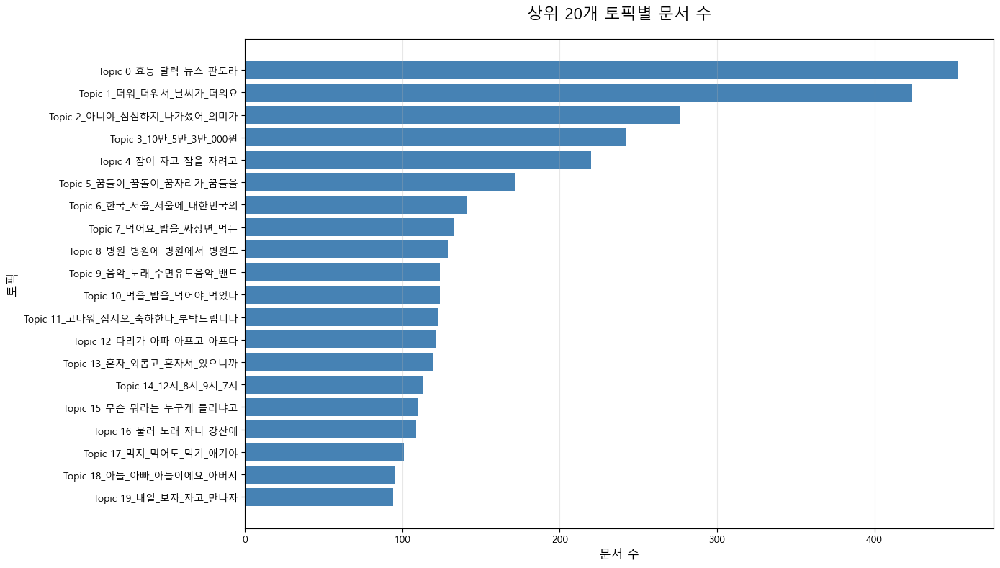


💾 결과 저장 중...

✅ 분석 완료!
📊 결과 요약:
  - 총 문서 수: 32973
  - 발견된 토픽 수: 741
  - 노이즈 문서 수: 12319


,text,topic,topic_prob,topic_keywords
0,내가,149,1.000000,"대답을, 답을, 해야지, 줄래요, 내가"
1,말씀 하겠네,-1,0.000000,NaN
2,사람이 없으니까,404,0.935386,"1가, 그러셨군요, 일이나, 재밌었어, 운전이나"
3,해 주세요,333,1.000000,"보내주세요, 주세요, 나눔로또, 장금이, 받으면서"
4,안 가니까 끝난 거지,649,1.000000,"끝났어, 끝난, 끝이네, 끝나가, 마무리합시다"
6,10만 원 정도 있으니 00님이 한숨을 쉬고는 않지 났구먼이라고,-1,0.000000,NaN
7,그런데 추라고 생각을 하고요 제가 이상한 거니 거예요 아니 얘기,-1,0.000000,NaN
8,야 그것이 너무,-1,0.000000,NaN
9,아빠 있잖아,-1,0.000000,NaN
10,똑바로 말해라,442,0.912569,"말씀드렸었는데, 시키라, 자는, 말씀드렸는데, 말했죠"


In [36]:

# === 토픽 분포 시각화 (matplotlib) ===
print("\n🎯=== 토픽 분포 막대 그래프 ===")
import matplotlib.pyplot as plt

topic_counts = topic_info[topic_info['Topic'] != -1].head(20)
topic_name_map = topic_info.set_index('Topic')['Name'].to_dict()

plt.figure(figsize=(14, 8))
plt.barh(range(len(topic_counts)), topic_counts['Count'], color='steelblue')
plt.yticks(range(len(topic_counts)),
           [f"Topic {topic_name_map[t]}" for t in topic_counts['Topic']])
plt.xlabel('문서 수', fontsize=12)
plt.ylabel('토픽', fontsize=12)
plt.title('상위 20개 토픽별 문서 수', fontsize=16, pad=20)
plt.gca().invert_yaxis()
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# === 결과 저장 (선택사항) ===
print("\n💾 결과 저장 중...")

# 토픽 정보를 데이터프레임에 추가
df['topic'] = topics
df['topic_prob'] = probs

# 토픽별 대표 키워드 추가
topic_keywords = {}
for topic_id in set(topics):
    if topic_id != -1:
        words = model.get_topic(topic_id)
        if words:
            topic_keywords[topic_id] = ', '.join([w[0] for w in words[:5]])

df['topic_keywords'] = df['topic'].map(topic_keywords)

print("\n✅ 분석 완료!")
print(f"📊 결과 요약:")
print(f"  - 총 문서 수: {len(texts)}")
print(f"  - 발견된 토픽 수: {len(set(topics)) - 1}")  # -1 제외
print(f"  - 노이즈 문서 수: {sum(1 for t in topics if t == -1)}")

display(df[['text', 'topic', 'topic_prob', 'topic_keywords']].head(10))

### ✅ Final  통합 분석 및 인사이트

#### ① 대화의 핵심 주제: 5대 관심사

어르신들의 대화는 다음 다섯 가지 주제에 집중된다:
- 건강과 신체 상태
- 가족 및 사회적 관계
- 일상과 안부
- 감정과 내면 상태
- 기능적 활용

이는 발화 데이터가 몸, 사람, 감정, 생활, 도구라는 다섯 가지 핵심 영역을 중심으로 구성되어 있음을 보여준다.
<br><br>
#### ② 다층적 대화 구조

분석 결과, 대화 데이터에는 세 가지 주요 역할이 공존한다:

| 역할 | 설명 |
|------|------|
| 정서적 표현 채널 | 건강·감정 고민을 공유하고 공감받는 발화 |
| 일상 동반자적 대화 | 날씨·안부 등 일상의 소소한 이야기를 나누는 발화 |
| 기능 활용 요청 | 음악 재생, 전화 연결 등 실생활 기능 활용 요청 발화 |

이는 데이터가 단일 목적이 아닌 복합적 사용 의도를 반영하고 있음을 보여준다.
<br><br>
#### ③ 숨겨진 요구와 Pain Point

토픽 분석에서 "전화 + 안되다", "노래 + 틀어줘" 등의 기능 관련 키워드가 자주 등장했다.
이는 다음과 같은 잠재적 요구와 불편을 시사한다:
- Latent Needs: 가족과 통화하고 싶다는 욕구
- Pain Point: 기능 사용이 어렵거나 잘 작동하지 않는 문제

즉, 사용자가 명시적으로 말하지 않아도 데이터 속에서 숨겨진 요구를 읽어낼 수 있다.
<br><br>
#### 🔻종합 결론

| 분석 단계 | 주요 결과 | 시사점 |
|-----------|----------|--------|
| NLP 기반 전처리 | 텍스트 구조화 성공 | 발화를 정량 분석 가능한 형태로 변환 |
| 워드클라우드 | 핵심 관심 키워드 도출 | 건강·관계·감정 중심의 대화 확인 |
| BERTopic | 문맥 기반 5대 주제 도출 | 복합적 대화 구조와 의도 파악 가능 |
| Pain Point | 기능 사용 관련 불편 발견 | 기능 개선 및 사용자 경험 향상 가능성 확보 |

<br>

#### 🔻전략적 제언

1. 정서 인식 기능 강화 – 감정 표현에 반응하는 대화 모델 고도화
2. 기능 사용성 개선 – 전화·음악 등 기능 접근성 및 성공률 향상
3. 개인 맞춤형 대화 설계 – 건강·관계·감정 기반 대화 흐름 최적화
4. 데이터 기반 서비스 진화 – NLP 분석 결과를 신규 기능 기획에 활용

<br>

#### 🔻요약

발화 데이터는 건강, 관계, 감정이라는 핵심 주제를 중심으로 구성되며, 이를 통해 단순 음성 인터페이스를 넘어 인간적 상호작용을 반영하는 대화형 시스템 설계의 방향성을 도출할 수 있다. 이 분석은 향후 맞춤형 기능 개발, 위험 감지 모델, 사용자 경험 개선 전략 수립에 활용될 수 있다.